In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define settings
input_dir = '/kaggle/input/shoplifting/Data/frames'
frame_size = (128, 128)
num_frames = 20  # Fixed number of frames

# Define categories
categories = ['shop_lifters', 'non_shop_lifters']
data = []
labels = []

# Step 1: Load frames, pad or truncate to num_frames
for category in categories:
    category_path = os.path.join(input_dir, category)
    label = categories.index(category)  # 0 or 1
    
    for video_folder in os.listdir(category_path):
        if video_folder.startswith('.'):  # Skip hidden files/folders
            continue
        
        video_path = os.path.join(category_path, video_folder)
        frames = []
        
        # Load frames in sorted order
        frame_files = sorted([f for f in os.listdir(video_path) if f.endswith('.jpg')])
        
        for frame_file in frame_files:
            frame_path = os.path.join(video_path, frame_file)
            frame = load_img(frame_path, target_size=frame_size)  # Resize to 128x128
            frame = img_to_array(frame)
            
            # ✅ Normalize to [0, 1]
            frame = frame / 255.0  
            
            frames.append(frame)

        # ✅ Pad or truncate to exactly `num_frames`
        if len(frames) < num_frames:
            padding = [np.zeros((128, 128, 3), dtype=np.float32)] * (num_frames - len(frames))
            frames.extend(padding)
        else:
            frames = frames[:num_frames]

        data.append(frames)
        labels.append(label)

# ✅ Convert to numpy arrays
data = np.array(data, dtype=np.float32)   # Shape: (num_samples, num_frames, 128, 128, 3)
labels = np.array(labels, dtype=np.int32) # Shape: (num_samples,)

# ✅ Print shapes to verify
print("Data shape:", data.shape)   # (num_samples, 20, 128, 128, 3)
print("Labels shape:", labels.shape)  # (num_samples,)


Data shape: (437, 20, 128, 128, 3)
Labels shape: (437,)


In [2]:
from sklearn.model_selection import train_test_split

# Split into training (70%) and temp (30%)
train_data, temp_data, train_labels, temp_labels = train_test_split(
    data, labels, test_size=0.3, random_state=42, stratify=labels
)

# Split temp into validation (50%) and test (50%)
val_data, test_data, val_labels, test_labels = train_test_split(
    temp_data, temp_labels, test_size=0.5, random_state=42, stratify=temp_labels
)

print(f"Train size: {train_data.shape[0]}, Validation size: {val_data.shape[0]}, Test size: {test_data.shape[0]}")


Train size: 305, Validation size: 66, Test size: 66


In [3]:
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import tensorflow as tf
max_frames = train_data.shape[1]  # Number of frames
frame_size = train_data.shape[2:4]  
model = models.Sequential([
    # Augmentation
    layers.TimeDistributed(layers.Conv2D(32, (3, 3), activation='relu'), input_shape=(max_frames, *frame_size, 3)),

    # CNN Layers
    layers.TimeDistributed(layers.Conv2D(32, (3, 3), activation='relu')),
    layers.TimeDistributed(layers.BatchNormalization()),
    layers.TimeDistributed(layers.MaxPooling2D((2, 2))),

    layers.TimeDistributed(layers.Conv2D(64, (3, 3), activation='relu')),
    layers.TimeDistributed(layers.BatchNormalization()),
    layers.TimeDistributed(layers.MaxPooling2D((2, 2))),

    layers.TimeDistributed(layers.Conv2D(128, (3, 3), activation='relu')),
    layers.TimeDistributed(layers.BatchNormalization()),
    layers.TimeDistributed(layers.MaxPooling2D((2, 2))),

    # Use GlobalAveragePooling instead of Flatten
    layers.TimeDistributed(layers.GlobalAveragePooling2D()),

    # Bidirectional LSTM Layer
    layers.Bidirectional(layers.LSTM(64, return_sequences=False)),

    # Fully Connected Layers
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])

# Compile with lower learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Recall()])

model.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed (TimeDistributed)   │ (None, 20, 126, 126, 32)    │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 124, 124, 32)    │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 20, 124, 124, 32)    │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 20, 62, 62, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_4 (TimeDistributed) │ (None, 20, 60, 60, 64)      │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 20, 60, 60, 64)      │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_6 (TimeDistributed) │ (None, 20, 30, 30, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 20, 28, 28, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 20, 28, 28, 128)     │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 20, 14, 14, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 20, 128)             │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 128)                 │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 210,529 (822.38 KB)

 Trainable params: 210,081 (820.63 KB)

 Non-trainable params: 448 (1.75 KB)

In [4]:
# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6),
    ModelCheckpoint('model_epoch_{epoch:02d}.keras', save_best_only=True, monitor='val_loss', mode='min', verbose=1)
]

from sklearn.utils import class_weight
import numpy as np

class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = dict(enumerate(class_weights))

history = model.fit(
    train_data, train_labels,
    epochs=15,
    batch_size=16,
    validation_data=(val_data, val_labels),
    callbacks=callbacks,
    class_weight=class_weights
)

Epoch 1/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 48s/step - accuracy: 0.4976 - loss: 0.6844 - recall: 0.7401 
Epoch 1: val_loss improved from inf to 0.74337, saving model to model_epoch_01.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 1016s 49s/step - accuracy: 0.5014 - loss: 0.6832 - recall: 0.7397 - val_accuracy: 0.4545 - val_loss: 0.7434 - val_recall: 1.0000 - learning_rate: 1.0000e-04
Epoch 2/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46s/step - accuracy: 0.6285 - loss: 0.6505 - recall: 0.6346 
Epoch 2: val_loss improved from 0.74337 to 0.69437, saving model to model_epoch_02.keras
20/20 ━━━━━━━━━━━━━━━━━━━━ 941s 47s/step - accuracy: 0.6309 - loss: 0.6494 - recall: 0.6379 - val_accuracy: 0.4394 - val_loss: 0.6944 - val_recall: 0.9667 - learning_rate: 1.0000e-04
Epoch 3/15
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47s/step - accuracy: 0.7058 - loss: 0.5978 - recall: 0.6910 
Epoch 3: val_loss did not improve from 0.69437
20/20 ━━━━━━━━━━━━━━━━━━━━ 953s 48s/step - accuracy: 0.7061 - loss: 0.5975 - recall: 0.6898 - val_accuracy

In [5]:
# Evaluate on validation set
val_loss, val_accuracy, val_recall = model.evaluate(val_data, val_labels, verbose=1)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")
print(f"Validation Recall: {val_recall:.4f}")

# Evaluate on test set
test_loss, test_accuracy, test_recall = model.evaluate(test_data, test_labels, verbose=1)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Recall: {test_recall:.4f}")


3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 5s/step - accuracy: 0.9770 - loss: 0.2018 - recall: 0.9488
Validation Loss: 0.2115
Validation Accuracy: 0.9697
Validation Recall: 0.9333
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 5s/step - accuracy: 0.9885 - loss: 0.2086 - recall: 0.9741
Test Loss: 0.2101
Test Accuracy: 0.9848
Test Recall: 0.9655


3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step

Sample 1: True: Shoplifting, Predicted: Shoplifting, Confidence: 0.8515


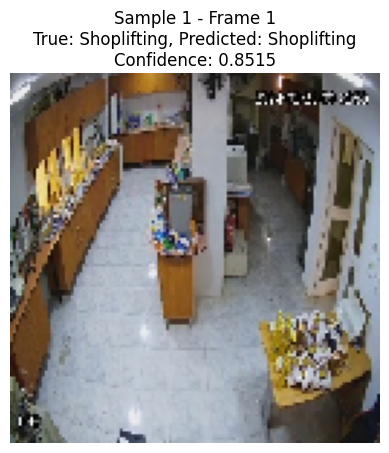

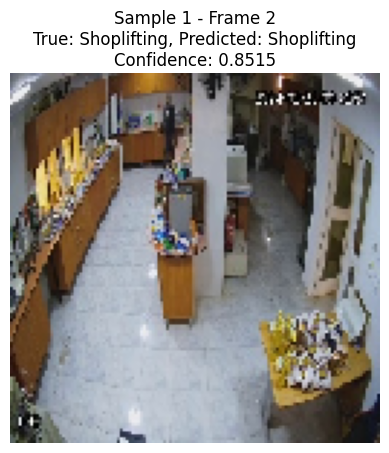

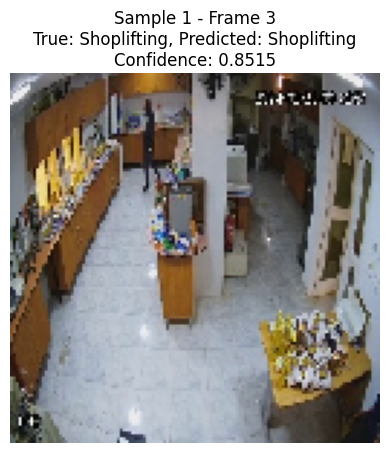

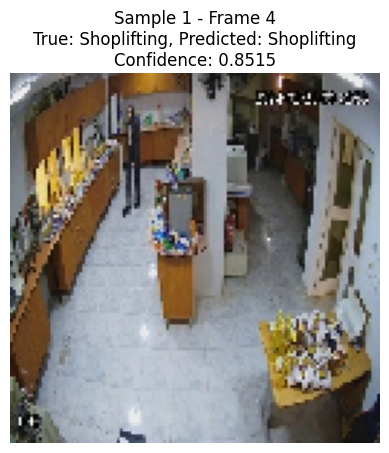

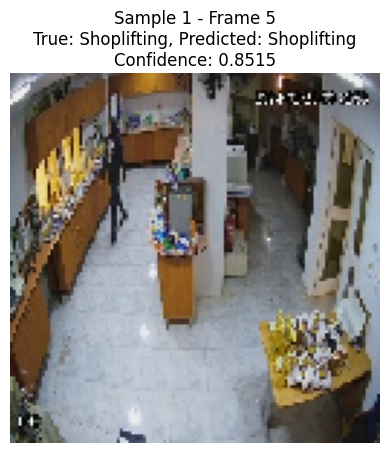

...

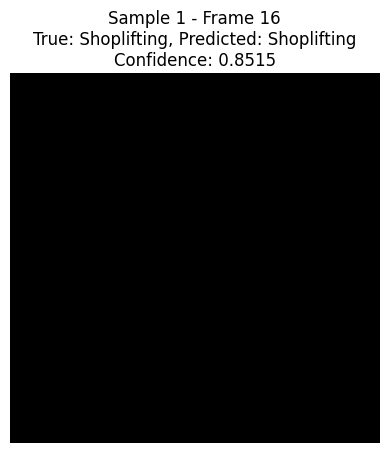

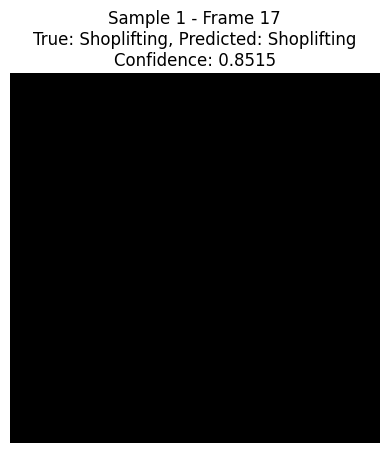

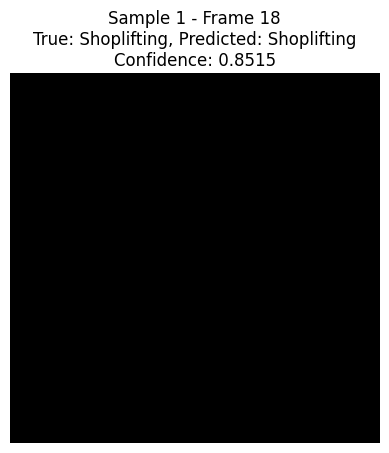

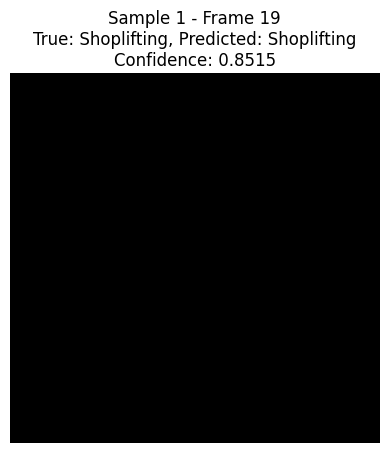

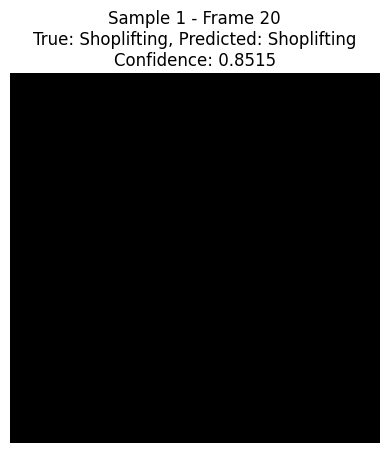


Sample 2: True: Non-shoplifting, Predicted: Non-shoplifting, Confidence: 0.1532


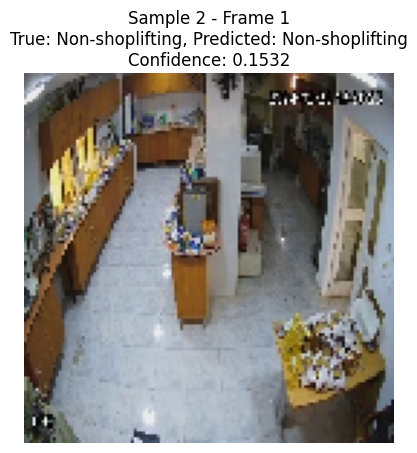

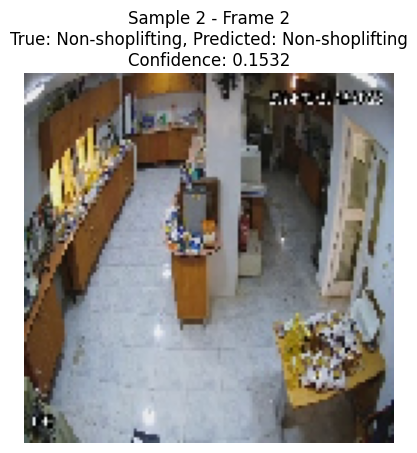

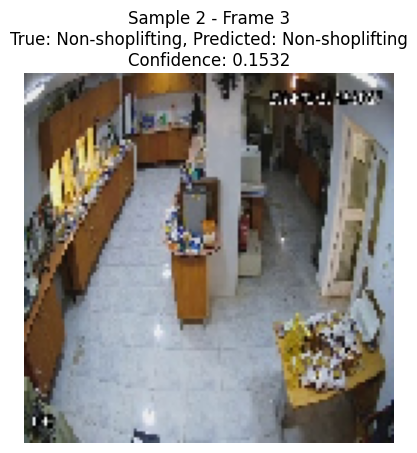

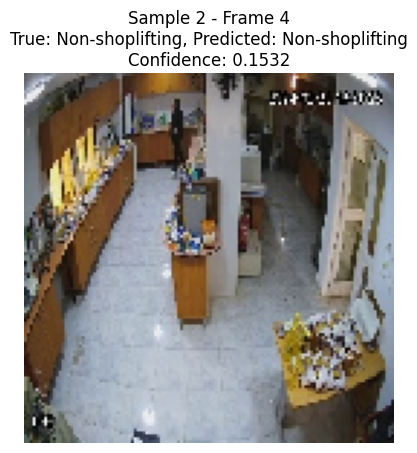

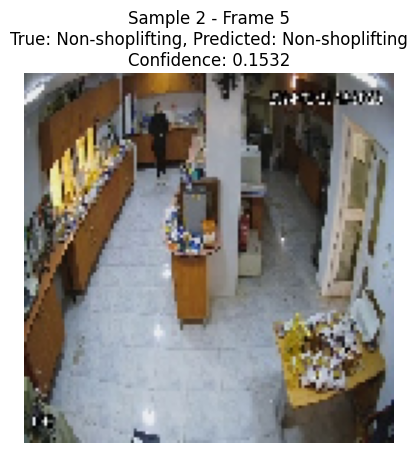

...

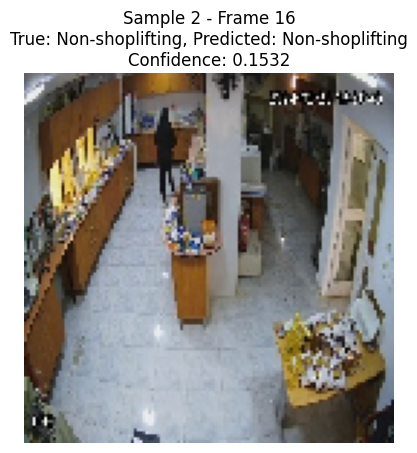

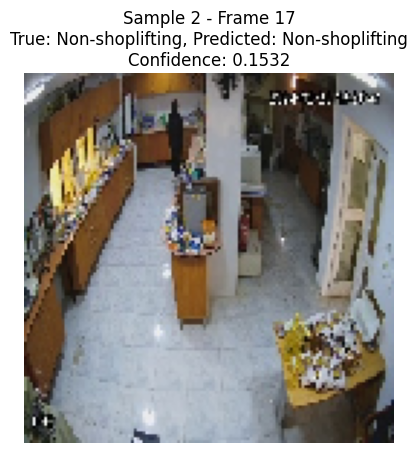

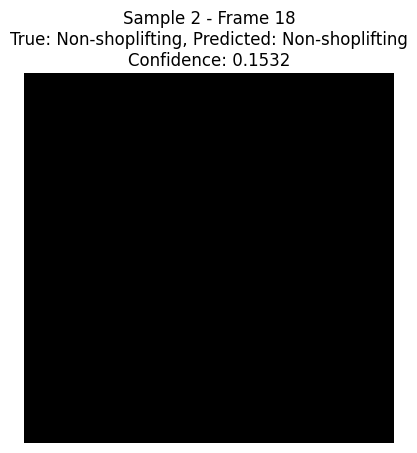

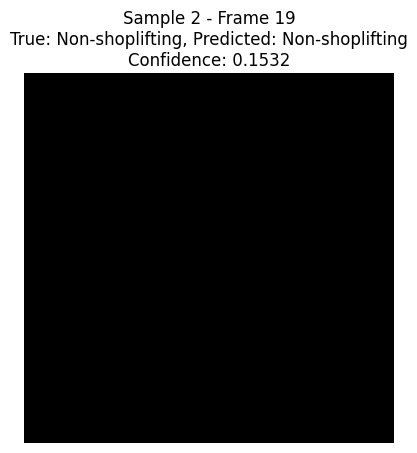

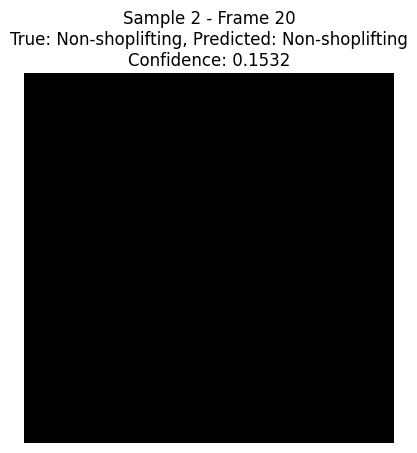


Sample 3: True: Shoplifting, Predicted: Shoplifting, Confidence: 0.8904


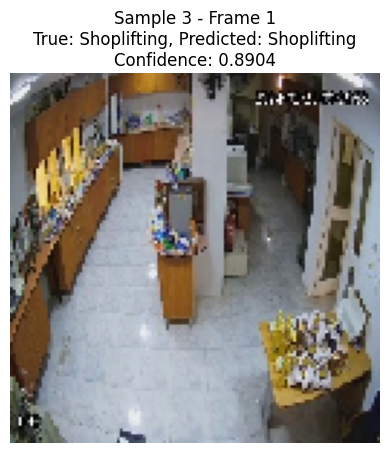

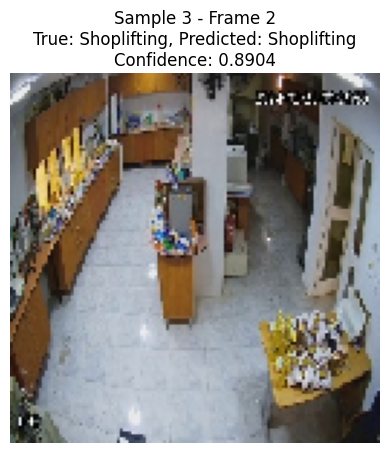

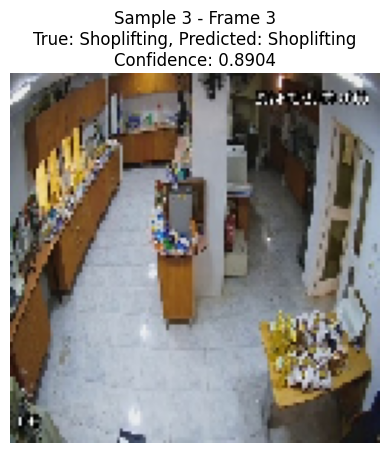

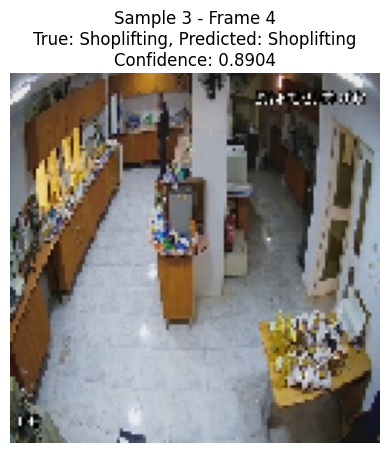

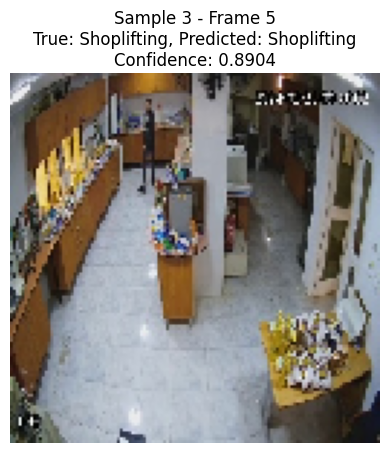

...

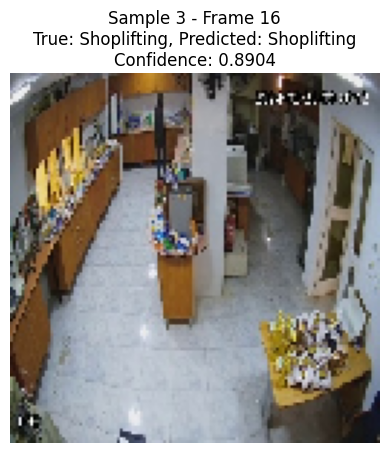

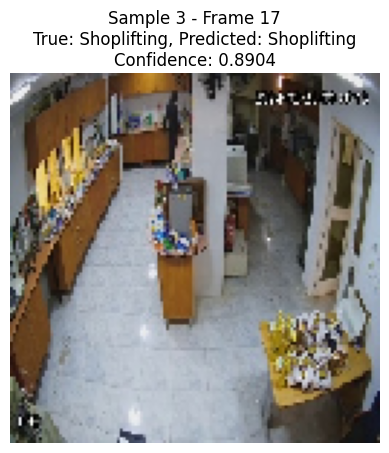

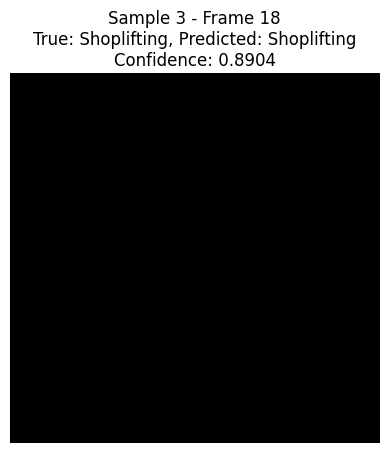

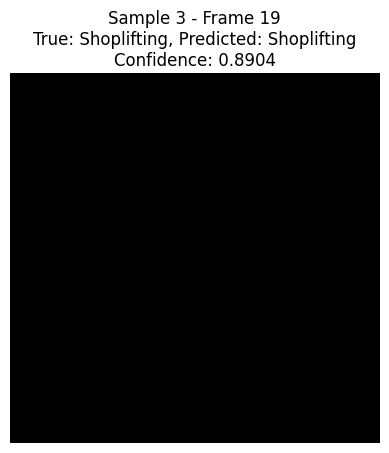

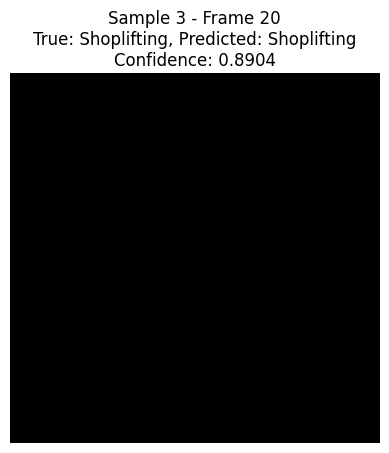


Sample 4: True: Shoplifting, Predicted: Shoplifting, Confidence: 0.7513


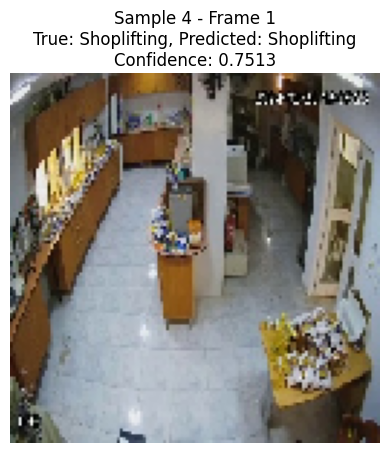

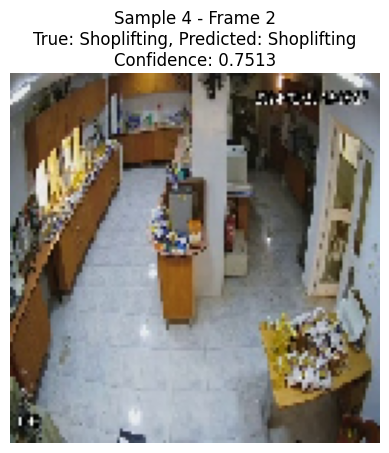

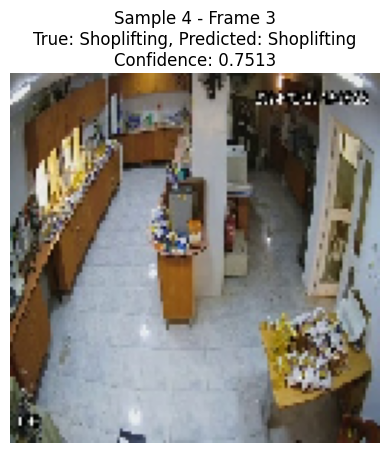

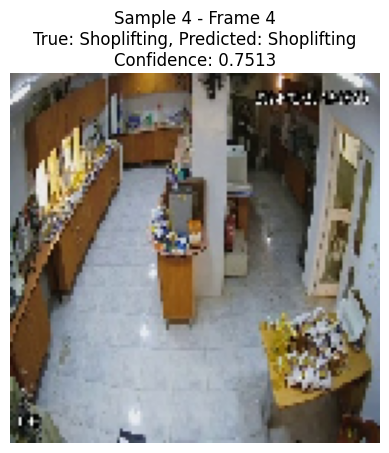

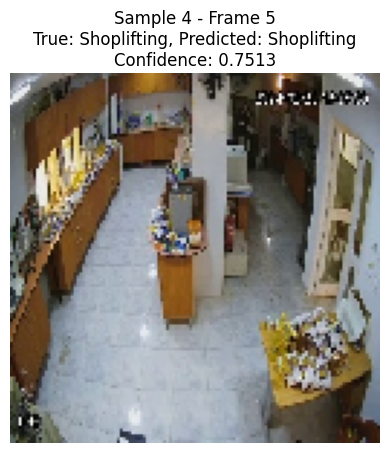

...

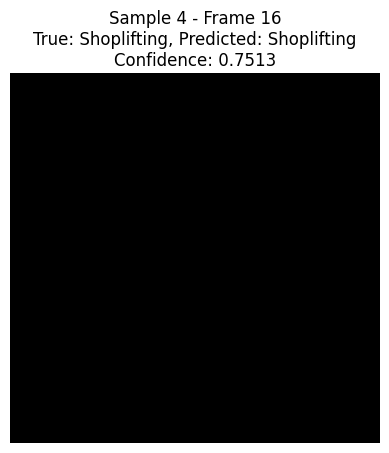

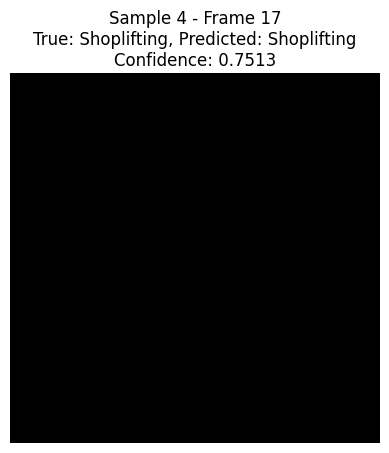

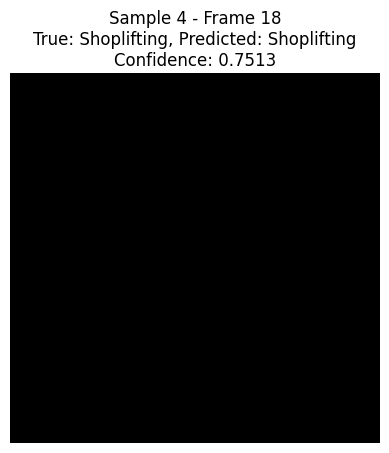

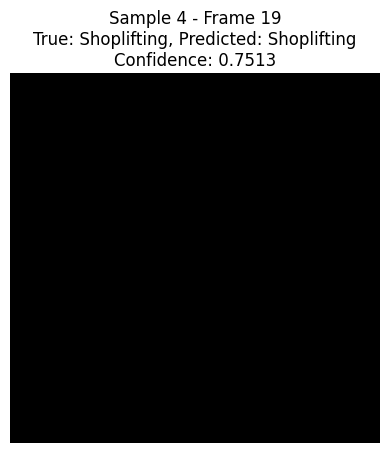

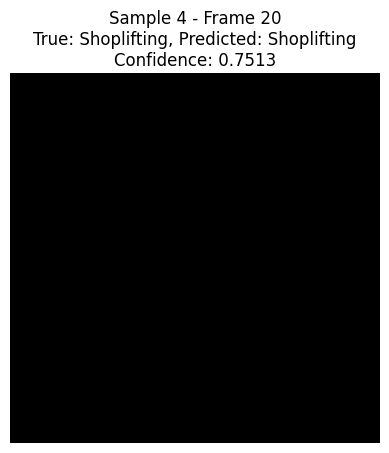


Sample 5: True: Non-shoplifting, Predicted: Non-shoplifting, Confidence: 0.1158


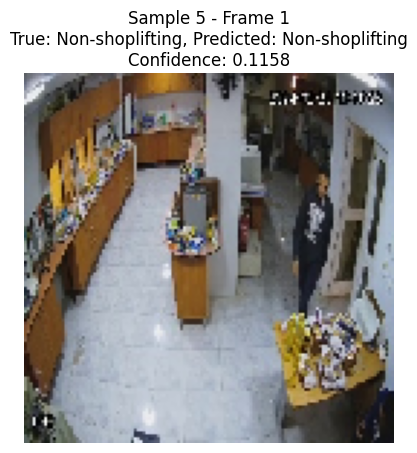

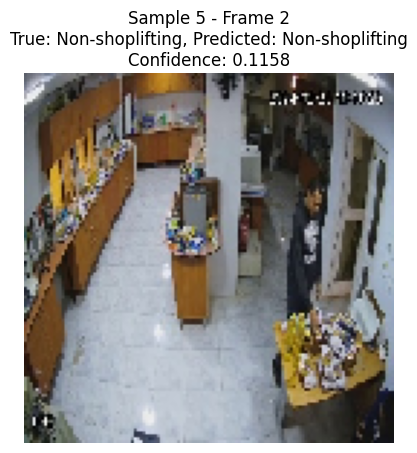

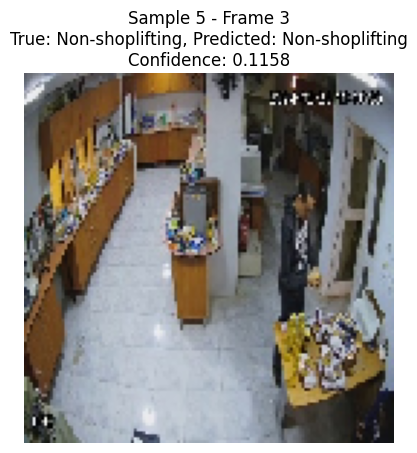

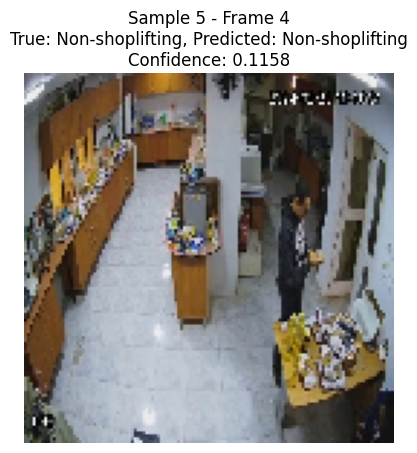

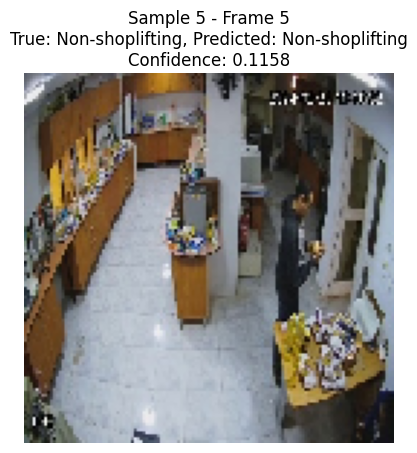

...

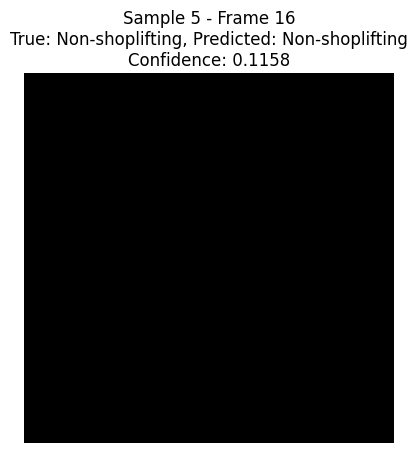

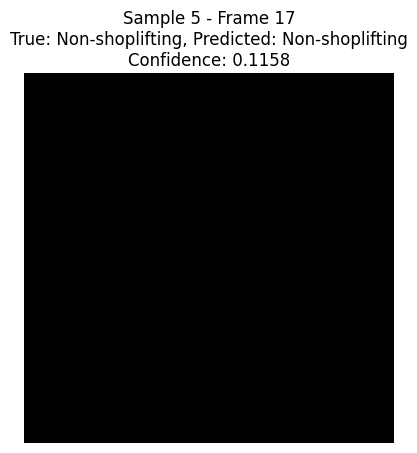

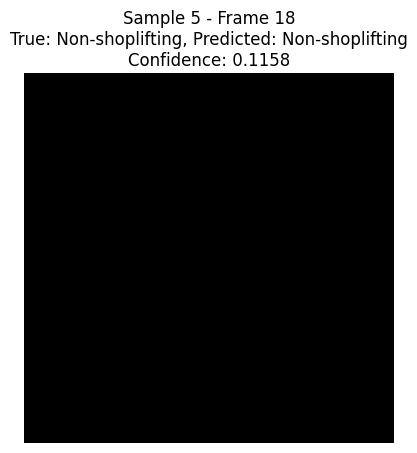

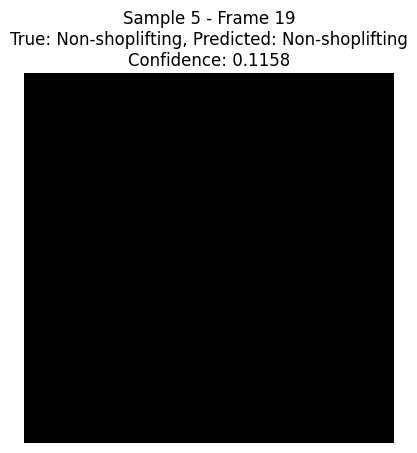

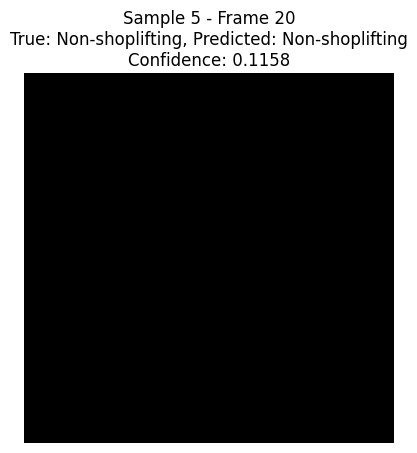

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Get predictions
Y_pred = model.predict(test_data)

# Convert to binary labels
Y_pred_labels = (Y_pred > 0.5).astype('int32')

# Show example predictions with frames
for idx in range(5):
    true_label = 'Shoplifting' if test_labels[idx] == 1 else 'Non-shoplifting'
    predicted_label = 'Shoplifting' if Y_pred_labels[idx] == 1 else 'Non-shoplifting'
    confidence = Y_pred[idx][0]

    print(f"\nSample {idx + 1}: True: {true_label}, Predicted: {predicted_label}, Confidence: {confidence:.4f}")

    # ✅ Display frames for the sample
    for frame_idx in range(test_data.shape[1]):
        frame = test_data[idx][frame_idx]

        # ✅ Scale to [0, 255] and convert to uint8 for display
        frame = np.clip(frame * 255, 0, 255).astype('uint8')

        plt.imshow(frame)
        plt.title(f"Sample {idx + 1} - Frame {frame_idx + 1}\n"
                  f"True: {true_label}, Predicted: {predicted_label}\n"
                  f"Confidence: {confidence:.4f}")
        plt.axis('off')
        plt.show()

